In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!nvidia-smi

Sat Jul  8 11:53:31 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    26W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Install necessary packages
!pip install -r /content/drive/MyDrive/FixCap/requirement.txt

In [ ]:
# # Code for extracting the zipped dataset folder
# import zipfile

# path_to_zip_file = '/content/drive/MyDrive/Skin_Cancer/FixCap Image Data/FixCap Image Data.zip'
# directory_to_extract_to = '/content/drive/MyDrive/Skin_Cancer/'

# with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
#     zip_ref.extractall(directory_to_extract_to)

In [ ]:
import torch
import sys, os
import json
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.optim as optim

# from torch.utils.tensorboard import SummaryWriter
import prettytable
import time
sys.setrecursionlimit(15000)
from thop.profile import profile

from PIL import Image
from torch.optim import lr_scheduler
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
from tqdm.notebook import tqdm
import seaborn as sns

import sys
sys.path.insert(0,'/content/drive/MyDrive/FixCap/Module/HAM10000')

from utils import ImageShow,draw_size_acc,one_hot
from utils import confusion_matrix,metrics_scores,pff

from model import FixCapsNet

In [ ]:
# Settings.
sys.path.append(os.pardir)
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
img_title = "HAM10000"
best_acc = 0.
eval_acc = 0.
best_train = 0.
dict_batch = {}
dict_imgSize = {}

#defined
try:
    print(len(train_acc_list))
except NameError:
    train_loss_list = []
    train_acc_list = []
    test_loss_list = []
    test_acc_list = []
    test_auc_list = []
    val_loss_list = []
    val_acc_list = []
#activate ImageShow
show = ImageShow(train_loss_list = train_loss_list,
                 train_acc_list = train_acc_list,
                test_loss_list = test_loss_list,
                test_acc_list = test_acc_list,
                test_auc_list = test_auc_list,
                val_loss_list = val_loss_list,
                val_acc_list = val_acc_list,
                )

In [ ]:
def get_data(trans_test='250'):
    global test_dataset,train_loader,val_loader,test_loader
    global train_num,val_num,test_num,n_classes,cla_dict
    data_transform = {
        "train": transforms.Compose([transforms.RandomResizedCrop((250, 250)),
                                     transforms.RandomVerticalFlip(),
                                     transforms.ToTensor(),
                                     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
        "val": transforms.Compose([transforms.Resize((250,250)),
                                   transforms.CenterCrop((250, 250)),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                  ]),
        "test": transforms.Compose([transforms.Resize((trans_test,trans_test)),
                                   transforms.CenterCrop((250, 250)),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                  ])
        }

    data_root = os.path.abspath(os.path.join(os.getcwd(),".."))  # get data root path
    image_path = '/content/drive/MyDrive/Skin_Cancer/FixCap Image Data/'#
    assert os.path.exists(image_path), "{} path does not exist.".format(image_path)

    train_dataset = datasets.ImageFolder(root=os.path.join(image_path,train_doc),#
                                         transform=data_transform["train"])
    val_dataset = datasets.ImageFolder(root=os.path.join(image_path,val_doc),
                                            transform=data_transform["val"])
    test_dataset = datasets.ImageFolder(root=os.path.join(image_path,test_doc),
                                            transform=data_transform["test"])

    train_num = len(train_dataset)
    val_num = len(val_dataset)
    test_num = len(test_dataset)

    data_list = train_dataset.class_to_idx
    cla_dict = dict((val, key) for key, val in data_list.items())
    n_classes  = len(data_list)
    print(f'Using {n_classes } classes.')
    # write dict into json file
    json_str = json.dumps(cla_dict, indent=4)
    with open(f'{img_title}.json', 'w') as json_file:#class_indices
        json_file.write(json_str)

    pin_memory = True
    train_loader = DataLoader(train_dataset,batch_size=BatchSize,
                                               pin_memory=pin_memory,
                                               shuffle=True,num_workers=nw)
    val_loader = DataLoader(val_dataset,batch_size=V_size,
                                               pin_memory=pin_memory,
                                               shuffle=False,num_workers=nw)
    test_loader = DataLoader(test_dataset,batch_size=T_size,
                                              pin_memory=pin_memory,
                                              shuffle=False,num_workers=nw)

    print("using {} images for training, {} images for validation, {} images for testing.".format(train_num,
                                                                                                  val_num,
                                                                                                  test_num))

In [ ]:
BatchSize = 168
V_size = 40
T_size = 32
train_doc = "train"
val_doc = "val"
test_doc = "test"

nw = min([os.cpu_count(), BatchSize if BatchSize > 1 else 0, 6])
print(f'Using {nw} dataloader workers every process.')
get_data()

Using 6 dataloader workers every process.
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.


In [ ]:
# Create capsule network.
n_channels = 3
conv_outputs = 128 #Feature_map
num_primary_units = 8
primary_unit_size = 16 * 6 * 6  # fixme get from conv2d
output_unit_size = 16
img_size = 250
mode='128'
network = FixCapsNet(conv_inputs=n_channels,
                     conv_outputs=conv_outputs,
                     primary_units=num_primary_units,
                     primary_unit_size=primary_unit_size,
                     num_classes=n_classes,
                     output_unit_size=16,
                     init_weights=True,
                     mode=mode)
network = network.to(device)
summary(network,(n_channels,img_size,img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [-1, 128, 117, 117]         124,544
              ReLU-2        [-1, 128, 117, 117]               0
FractionalMaxPool2d-3          [-1, 128, 20, 20]               0
            Conv2d-4          [-1, 128, 20, 20]          16,384
       BatchNorm2d-5          [-1, 128, 20, 20]             256
         Hardswish-6          [-1, 128, 20, 20]               0
 AdaptiveAvgPool2d-7            [-1, 128, 1, 1]               0
            Conv2d-8            [-1, 128, 1, 1]          16,384
              ReLU-9            [-1, 128, 1, 1]               0
           Conv2d-10            [-1, 128, 1, 1]          16,384
AdaptiveMaxPool2d-11            [-1, 128, 1, 1]               0
           Conv2d-12            [-1, 128, 1, 1]          16,384
             ReLU-13            [-1, 128, 1, 1]               0
           Conv2d-14            [-1, 1

In [ ]:
network.Convolution

Sequential(
  (0): Conv2d(3, 128, kernel_size=(18, 18), stride=(2, 2))
  (1): ReLU(inplace=True)
  (2): FractionalMaxPool2d()
)

In [ ]:
dsize = (1, 3, 250, 250)
input_data = torch.randn(dsize).to(device)
pff(m_name="FixCaps"+'-'+mode,model=network,inputes=input_data)

+-------------+-----------+----------+-------+
|    Model    | Params(M) | FLOPs(G) |  FPS  |
+-------------+-----------+----------+-------+
| FixCaps-128 |    0.26   |   1.71   | 60.83 |
+-------------+-----------+----------+-------+


In [ ]:
def train(epoch):
    network.train()
    global best_train,train_evl_result#,evl_tmp_result
    running_loss,r_pre = 0., 0.
    print_step = len(train_loader)//2
    steps_num = len(train_loader)
    tmp_size = BatchSize
    print(f'\033[1;32m[Train Epoch:[{epoch}]{img_title} ==> Training]\033[0m ...')
    optimizer.zero_grad()
    train_tmp_result = torch.zeros(n_classes,n_classes)

    for batch_idx, (data, target) in enumerate(tqdm(train_loader)):

        batch_idx += 1
        target_indices = target
        target_one_hot = one_hot(target, length=n_classes)
        data, target = Variable(data).to(device), Variable(target_one_hot).to(device)

        output = network(data)
        loss = network.loss(output, target, size_average=True)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        running_loss += loss.item()

        v_mag = torch.sqrt(torch.sum(output**2, dim=2, keepdim=True))
        pred = v_mag.data.max(1, keepdim=True)[1].cpu().squeeze()
        r_pre += pred.eq(target_indices.view_as(pred)).squeeze().sum()
        tmp_pre = r_pre/(batch_idx*BatchSize)

        if batch_idx % print_step == 0 and batch_idx != steps_num:
            print("[{}/{}] Loss{:.5f},ACC:{:.5f}".format(batch_idx,len(train_loader),
                                                         loss,tmp_pre))
        if batch_idx % steps_num == 0 and train_num % tmp_size != 0:
            tmp_size = train_num % tmp_size

        for i in range(tmp_size):
            pred_x = pred.numpy()
            train_tmp_result[target_indices[i]][pred_x[i]] +=1

        if best_train < tmp_pre and tmp_pre >= 80:
            torch.save(network.state_dict(), iter_path)

    epoch_acc = r_pre / train_num
    epoch_loss = running_loss / len(train_loader)
    train_loss_list.append(epoch_loss)
    train_acc_list.append(epoch_acc)
    scheduler.step()
    if best_train < epoch_acc:
        best_train = epoch_acc
        train_evl_result = train_tmp_result.clone()
        torch.save(network.state_dict(), last_path)
        torch.save(train_evl_result, f'/content/drive/MyDrive/Fix/{img_title}/{suf}/train_evl_result.pth')

    print("Train Epoch:[{}] Loss:{:.5f},Acc:{:.5f},Best_train:{:.5f}".format(epoch,epoch_loss,
                                                                     epoch_acc,best_train))

In [ ]:
def test(split="test"):
    network.eval()
    global test_acc,eval_acc,best_acc,net_parameters
    global test_evl_result,val_evl_result#,evl_tmp_result
    cor_loss,correct,Auc, Acc= 0, 0, 0, 0
    evl_tmp_result = torch.zeros(n_classes,n_classes)

    if split == 'val':
        data_loader = val_loader
        tmp_size = V_size
        data_num = val_num
    else:
        data_loader = test_loader
        tmp_size = T_size
        data_num = test_num

    steps_num = len(data_loader)
    print(f'\033[35m{img_title} ==> {split} ...\033[0m')

    with torch.no_grad():
        for batch_idx, (data, target) in enumerate(tqdm(data_loader)):
            batch_idx +=1
            target_indices = target#torch.Size([batch, 7])
            target_one_hot = one_hot(target, length=n_classes)
            data, target = Variable(data).to(device), Variable(target_one_hot).to(device)

            output= network(data)#torch.Size([batch_size, 7, 16, 1])
            v_mag = torch.sqrt(torch.sum(output**2, dim=2, keepdim=True))
            pred = v_mag.data.max(1, keepdim=True)[1].cpu()#[9, 2, 1, 1, 6,..., 1, 4, 6, 5, 7,]

            if batch_idx % steps_num == 0 and data_num % tmp_size != 0:
                tmp_size = data_num % tmp_size

            for i in range(tmp_size):
                pred_y = pred.numpy()
                evl_tmp_result[target_indices[i]][pred_y[i]] +=1

        diag_sum = torch.sum(evl_tmp_result.diagonal())
        all_sum = torch.sum(evl_tmp_result)
        test_acc = 100. * float(torch.div(diag_sum,all_sum))
        print(f"{split}_Acc:\033[1;32m{round(float(test_acc),3)}%\033[0m")

        if split == 'val':
            val_acc_list.append(test_acc)
            if test_acc >= best_acc:
                best_acc = test_acc
                val_evl_result = evl_tmp_result.clone()#copy.deepcopy(input)
                torch.save(network.state_dict(), save_PATH)
                torch.save(val_evl_result, f'/content/drive/MyDrive/Fix/{img_title}/{suf}/best_evl_result.pth')
            print(f"Best_val:\033[1;32m[{round(float(best_acc),3)}%]\033[0m")
        else:
            test_acc_list.append(test_acc)
            if test_acc >= eval_acc:
                eval_acc = test_acc
                test_evl_result = evl_tmp_result.clone()#copy.deepcopy(input)
                torch.save(network.state_dict(), f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{split}_best_{img_title}_{suf}.pth')
                torch.save(test_evl_result, f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{split}_evl_result.pth')
            print(f"Best_eval:\033[1;32m[{round(float(eval_acc),3)}%]\033[0m")


In [ ]:
#create store
try:
    print(f"suf:{suf}")
except NameError:
    suf = time.strftime("%m%d_%H%M%S", time.localtime())
    print(f"suf:{suf}")
if os.path.exists(f'/content/drive/MyDrive/Fix/{img_title}/{suf}'):
    print (f'Store: "/content/drive/MyDrive/Fix/{img_title}/{suf}"')
else:
    !mkdir -p /content/drive/MyDrive/Fix/{img_title}/{suf}
iter_path = f'/content/drive/MyDrive/Fix/{img_title}/{suf}/train_{img_title}_{suf}.pth'
save_PATH = f'/content/drive/MyDrive/Fix/{img_title}/{suf}/best_{img_title}_{suf}.pth'
last_path = f'/content/drive/MyDrive/Fix/{img_title}/{suf}/last_{img_title}_{suf}.pth'
print(save_PATH)

suf:0708_115412
Store: "/content/drive/MyDrive/Fix/HAM10000/0708_115412"
/content/drive/MyDrive/Fix/HAM10000/0708_115412/best_HAM10000_0708_115412.pth


In [ ]:
learning_rate = 0.123
optimizer = optim.Adam(network.parameters(), lr=learning_rate)
scheduler = lr_scheduler.CosineAnnealingLR(optimizer, 5, eta_min=1e-8, last_epoch=-1)

# scheduler = lr_scheduler.OneCycleLR(optimizer, max_lr=learning_rate,
#                         steps_per_epoch=len(train_loader),
#                         epochs=num_epochs)

In [ ]:
num_epochs = 120

In [ ]:
for epoch in range(1, num_epochs + 1): #4h 26m 46s
    train(epoch)
    test('val')

print('Finished Training')

[Train Epoch:[1]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.48710,ACC:0.15327
Train Epoch:[1] Loss:0.56102,Acc:0.18007,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:27.703%
Best_val:[82.492%]
[Train Epoch:[2]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.44554,ACC:0.26042
Train Epoch:[2] Loss:0.44278,Acc:0.27382,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:33.986%
Best_val:[82.492%]
[Train Epoch:[3]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.40738,ACC:0.33879
Train Epoch:[3] Loss:0.41514,Acc:0.34601,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:49.949%
Best_val:[82.492%]
[Train Epoch:[4]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.38462,ACC:0.38393
Train Epoch:[4] Loss:0.39204,Acc:0.38813,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:62.513%
Best_val:[82.492%]
[Train Epoch:[5]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.39385,ACC:0.40427
Train Epoch:[5] Loss:0.38361,Acc:0.40098,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:66.735%
Best_val:[82.492%]
[Train Epoch:[6]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.37973,ACC:0.38542
Train Epoch:[6] Loss:0.38045,Acc:0.40406,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:67.044%
Best_val:[82.492%]
[Train Epoch:[7]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.39036,ACC:0.39484
Train Epoch:[7] Loss:0.37913,Acc:0.40688,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:67.353%
Best_val:[82.492%]
[Train Epoch:[8]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.38469,ACC:0.39187
Train Epoch:[8] Loss:0.38254,Acc:0.40098,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:59.732%
Best_val:[82.492%]
[Train Epoch:[9]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.37091,ACC:0.41171
Train Epoch:[9] Loss:0.37525,Acc:0.41254,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:66.014%
Best_val:[82.492%]
[Train Epoch:[10]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.38794,ACC:0.44593
Train Epoch:[10] Loss:0.37447,Acc:0.42718,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:49.64%
Best_val:[82.492%]
[Train Epoch:[11]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.36528,ACC:0.40228
Train Epoch:[11] Loss:0.37699,Acc:0.41176,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:58.29%
Best_val:[82.492%]
[Train Epoch:[12]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.36523,ACC:0.41220
Train Epoch:[12] Loss:0.36693,Acc:0.41819,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:49.537%
Best_val:[82.492%]
[Train Epoch:[13]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.36531,ACC:0.43204
Train Epoch:[13] Loss:0.36006,Acc:0.44541,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:57.261%
Best_val:[82.492%]
[Train Epoch:[14]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.36282,ACC:0.43304
Train Epoch:[14] Loss:0.35654,Acc:0.44387,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:65.499%
Best_val:[82.492%]
[Train Epoch:[15]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32615,ACC:0.46379
Train Epoch:[15] Loss:0.34949,Acc:0.45877,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.768%
Best_val:[82.492%]
[Train Epoch:[16]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34421,ACC:0.46677
Train Epoch:[16] Loss:0.34239,Acc:0.46571,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.635%
Best_val:[82.492%]
[Train Epoch:[17]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.36048,ACC:0.45288
Train Epoch:[17] Loss:0.34443,Acc:0.47239,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.18%
Best_val:[82.492%]
[Train Epoch:[18]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.33840,ACC:0.47123
Train Epoch:[18] Loss:0.34321,Acc:0.46930,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.871%
Best_val:[82.492%]
[Train Epoch:[19]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.35009,ACC:0.48016
Train Epoch:[19] Loss:0.34951,Acc:0.47316,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.091%
Best_val:[82.492%]
[Train Epoch:[20]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34814,ACC:0.47173
Train Epoch:[20] Loss:0.35171,Acc:0.46083,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:60.35%
Best_val:[82.492%]
[Train Epoch:[21]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34426,ACC:0.44296
Train Epoch:[21] Loss:0.34879,Acc:0.44670,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:66.941%
Best_val:[82.492%]
[Train Epoch:[22]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34907,ACC:0.46131
Train Epoch:[22] Loss:0.34512,Acc:0.46674,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:59.938%
Best_val:[82.492%]
[Train Epoch:[23]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.35285,ACC:0.47867
Train Epoch:[23] Loss:0.33554,Acc:0.47881,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:67.868%
Best_val:[82.492%]
[Train Epoch:[24]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32022,ACC:0.49306
Train Epoch:[24] Loss:0.32877,Acc:0.49422,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.915%
Best_val:[82.492%]
[Train Epoch:[25]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.33118,ACC:0.49653
Train Epoch:[25] Loss:0.32316,Acc:0.49653,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.429%
Best_val:[82.492%]
[Train Epoch:[26]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32604,ACC:0.51389
Train Epoch:[26] Loss:0.32216,Acc:0.51117,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.15%
Best_val:[82.492%]
[Train Epoch:[27]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34375,ACC:0.49554
Train Epoch:[27] Loss:0.32011,Acc:0.50886,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.768%
Best_val:[82.492%]
[Train Epoch:[28]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.33104,ACC:0.50992
Train Epoch:[28] Loss:0.32664,Acc:0.50090,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:68.177%
Best_val:[82.492%]
[Train Epoch:[29]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.33469,ACC:0.48562
Train Epoch:[29] Loss:0.32603,Acc:0.48369,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.313%
Best_val:[82.492%]
[Train Epoch:[30]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.34720,ACC:0.49702
Train Epoch:[30] Loss:0.32822,Acc:0.49396,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:65.396%
Best_val:[82.492%]
[Train Epoch:[31]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28478,ACC:0.50000
Train Epoch:[31] Loss:0.32383,Acc:0.49473,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:71.679%
Best_val:[82.492%]
[Train Epoch:[32]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.35880,ACC:0.50149
Train Epoch:[32] Loss:0.32488,Acc:0.49961,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:69.619%
Best_val:[82.492%]
[Train Epoch:[33]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.30937,ACC:0.51538
Train Epoch:[33] Loss:0.32726,Acc:0.50372,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:69.31%
Best_val:[82.492%]
[Train Epoch:[34]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32167,ACC:0.50942
Train Epoch:[34] Loss:0.31860,Acc:0.51451,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:68.795%
Best_val:[82.492%]
[Train Epoch:[35]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.30832,ACC:0.51587
Train Epoch:[35] Loss:0.30834,Acc:0.51837,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.356%
Best_val:[82.492%]
[Train Epoch:[36]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32932,ACC:0.51984
Train Epoch:[36] Loss:0.30651,Acc:0.52659,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.253%
Best_val:[82.492%]
[Train Epoch:[37]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32071,ACC:0.51538
Train Epoch:[37] Loss:0.30462,Acc:0.52710,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.077%
Best_val:[82.492%]
[Train Epoch:[38]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29916,ACC:0.51835
Train Epoch:[38] Loss:0.30767,Acc:0.52068,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.592%
Best_val:[82.492%]
[Train Epoch:[39]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32840,ACC:0.51290
Train Epoch:[39] Loss:0.30689,Acc:0.52556,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:70.855%
Best_val:[82.492%]
[Train Epoch:[40]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29043,ACC:0.53323
Train Epoch:[40] Loss:0.31503,Acc:0.52787,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:63.028%
Best_val:[82.492%]
[Train Epoch:[41]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29867,ACC:0.53770
Train Epoch:[41] Loss:0.31489,Acc:0.52993,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:59.32%
Best_val:[82.492%]
[Train Epoch:[42]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27710,ACC:0.52827
Train Epoch:[42] Loss:0.30970,Acc:0.52299,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:71.267%
Best_val:[82.492%]
[Train Epoch:[43]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.31336,ACC:0.54663
Train Epoch:[43] Loss:0.30064,Acc:0.54842,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.798%
Best_val:[82.492%]
[Train Epoch:[44]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27262,ACC:0.55903
Train Epoch:[44] Loss:0.29805,Acc:0.56126,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.386%
Best_val:[82.492%]
[Train Epoch:[45]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29009,ACC:0.56250
Train Epoch:[45] Loss:0.28919,Acc:0.56666,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.725%
Best_val:[82.492%]
[Train Epoch:[46]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.30006,ACC:0.56994
Train Epoch:[46] Loss:0.28889,Acc:0.56948,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.519%
Best_val:[82.492%]
[Train Epoch:[47]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27362,ACC:0.57093
Train Epoch:[47] Loss:0.28886,Acc:0.57051,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.047%
Best_val:[82.492%]
[Train Epoch:[48]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28374,ACC:0.56746
Train Epoch:[48] Loss:0.29075,Acc:0.55972,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.194%
Best_val:[82.492%]
[Train Epoch:[49]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27016,ACC:0.55208
Train Epoch:[49] Loss:0.29793,Acc:0.54354,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:70.237%
Best_val:[82.492%]
[Train Epoch:[50]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.30008,ACC:0.52530
Train Epoch:[50] Loss:0.31415,Acc:0.52890,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:58.496%
Best_val:[82.492%]
[Train Epoch:[51]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.32219,ACC:0.52232
Train Epoch:[51] Loss:0.30673,Acc:0.52787,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:66.838%
Best_val:[82.492%]
[Train Epoch:[52]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.31837,ACC:0.56052
Train Epoch:[52] Loss:0.30400,Acc:0.54637,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:64.779%
Best_val:[82.492%]
[Train Epoch:[53]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28890,ACC:0.54762
Train Epoch:[53] Loss:0.29289,Acc:0.55227,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.459%
Best_val:[82.492%]
[Train Epoch:[54]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28577,ACC:0.58433
Train Epoch:[54] Loss:0.28644,Acc:0.57693,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.606%
Best_val:[82.492%]
[Train Epoch:[55]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27652,ACC:0.57639
Train Epoch:[55] Loss:0.28064,Acc:0.57950,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.253%
Best_val:[82.492%]
[Train Epoch:[56]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26696,ACC:0.58681
Train Epoch:[56] Loss:0.28094,Acc:0.58027,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.562%
Best_val:[82.492%]
[Train Epoch:[57]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27919,ACC:0.58532
Train Epoch:[57] Loss:0.27934,Acc:0.58438,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.047%
Best_val:[82.492%]
[Train Epoch:[58]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26775,ACC:0.57639
Train Epoch:[58] Loss:0.28205,Acc:0.57462,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:68.692%
Best_val:[82.492%]
[Train Epoch:[59]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27142,ACC:0.57391
Train Epoch:[59] Loss:0.28867,Acc:0.56743,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:67.662%
Best_val:[82.492%]
[Train Epoch:[60]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.31872,ACC:0.55060
Train Epoch:[60] Loss:0.29553,Acc:0.55304,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.785%
Best_val:[82.492%]
[Train Epoch:[61]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26620,ACC:0.56498
Train Epoch:[61] Loss:0.29344,Acc:0.55844,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.665%
Best_val:[82.492%]
[Train Epoch:[62]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29017,ACC:0.54167
Train Epoch:[62] Loss:0.28892,Acc:0.55587,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:70.34%
Best_val:[82.492%]
[Train Epoch:[63]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29115,ACC:0.58829
Train Epoch:[63] Loss:0.27743,Acc:0.58644,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.738%
Best_val:[82.492%]
[Train Epoch:[64]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26906,ACC:0.58978
Train Epoch:[64] Loss:0.27347,Acc:0.59748,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.446%
Best_val:[82.492%]
[Train Epoch:[65]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25716,ACC:0.59573
Train Epoch:[65] Loss:0.26978,Acc:0.59697,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.12%
Best_val:[82.492%]
[Train Epoch:[66]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26449,ACC:0.59375
Train Epoch:[66] Loss:0.26976,Acc:0.60468,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.107%
Best_val:[82.492%]
[Train Epoch:[67]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27232,ACC:0.61756
Train Epoch:[67] Loss:0.26875,Acc:0.60827,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.622%
Best_val:[82.492%]
[Train Epoch:[68]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24617,ACC:0.60813
Train Epoch:[68] Loss:0.27351,Acc:0.59697,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.326%
Best_val:[82.492%]
[Train Epoch:[69]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26129,ACC:0.60714
Train Epoch:[69] Loss:0.27219,Acc:0.59671,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.429%
Best_val:[82.492%]
[Train Epoch:[70]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28140,ACC:0.57738
Train Epoch:[70] Loss:0.28193,Acc:0.58618,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.018%
Best_val:[82.492%]
[Train Epoch:[71]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29078,ACC:0.57986
Train Epoch:[71] Loss:0.27768,Acc:0.58901,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.197%
Best_val:[82.492%]
[Train Epoch:[72]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29748,ACC:0.57937
Train Epoch:[72] Loss:0.27880,Acc:0.58207,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:68.074%
Best_val:[82.492%]
[Train Epoch:[73]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27208,ACC:0.60665
Train Epoch:[73] Loss:0.26778,Acc:0.59979,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.004%
Best_val:[82.492%]
[Train Epoch:[74]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.28287,ACC:0.61458
Train Epoch:[74] Loss:0.26629,Acc:0.60801,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.297%
Best_val:[82.492%]
[Train Epoch:[75]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26855,ACC:0.63591
Train Epoch:[75] Loss:0.25865,Acc:0.62677,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.24%
Best_val:[82.492%]
[Train Epoch:[76]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25816,ACC:0.63294
Train Epoch:[76] Loss:0.25461,Acc:0.62754,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.064%
Best_val:[82.492%]
[Train Epoch:[77]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27208,ACC:0.62153
Train Epoch:[77] Loss:0.26058,Acc:0.62034,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.446%
Best_val:[82.492%]
[Train Epoch:[78]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23022,ACC:0.61111
Train Epoch:[78] Loss:0.26424,Acc:0.61649,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.742%
Best_val:[82.492%]
[Train Epoch:[79]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27302,ACC:0.59821
Train Epoch:[79] Loss:0.27056,Acc:0.60005,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.592%
Best_val:[82.492%]
[Train Epoch:[80]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.29316,ACC:0.61260
Train Epoch:[80] Loss:0.26673,Acc:0.61033,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:74.047%
Best_val:[82.492%]
[Train Epoch:[81]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25415,ACC:0.60466
Train Epoch:[81] Loss:0.27017,Acc:0.59646,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.506%
Best_val:[82.492%]
[Train Epoch:[82]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27832,ACC:0.58581
Train Epoch:[82] Loss:0.27500,Acc:0.59800,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.416%
Best_val:[82.492%]
[Train Epoch:[83]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24359,ACC:0.59970
Train Epoch:[83] Loss:0.27005,Acc:0.59723,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:70.752%
Best_val:[82.492%]
[Train Epoch:[84]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27113,ACC:0.63492
Train Epoch:[84] Loss:0.26121,Acc:0.61932,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.167%
Best_val:[82.492%]
[Train Epoch:[85]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24788,ACC:0.62351
Train Epoch:[85] Loss:0.25358,Acc:0.62522,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.961%
Best_val:[82.492%]
[Train Epoch:[86]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23955,ACC:0.62252
Train Epoch:[86] Loss:0.25111,Acc:0.62548,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.961%
Best_val:[82.492%]
[Train Epoch:[87]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24188,ACC:0.62897
Train Epoch:[87] Loss:0.25358,Acc:0.62959,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.652%
Best_val:[82.492%]
[Train Epoch:[88]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27623,ACC:0.64038
Train Epoch:[88] Loss:0.25138,Acc:0.63550,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:73.532%
Best_val:[82.492%]
[Train Epoch:[89]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26066,ACC:0.62401
Train Epoch:[89] Loss:0.25648,Acc:0.62060,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.24%
Best_val:[82.492%]
[Train Epoch:[90]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26292,ACC:0.61756
Train Epoch:[90] Loss:0.26433,Acc:0.61392,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.931%
Best_val:[82.492%]
[Train Epoch:[91]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25632,ACC:0.61458
Train Epoch:[91] Loss:0.26829,Acc:0.60930,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.931%
Best_val:[82.492%]
[Train Epoch:[92]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27044,ACC:0.61409
Train Epoch:[92] Loss:0.26175,Acc:0.61803,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.094%
Best_val:[82.492%]
[Train Epoch:[93]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26519,ACC:0.62004
Train Epoch:[93] Loss:0.25648,Acc:0.62420,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:75.798%
Best_val:[82.492%]
[Train Epoch:[94]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27012,ACC:0.62004
Train Epoch:[94] Loss:0.25386,Acc:0.61726,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.094%
Best_val:[82.492%]
[Train Epoch:[95]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25414,ACC:0.61260
Train Epoch:[95] Loss:0.24493,Acc:0.64218,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.506%
Best_val:[82.492%]
[Train Epoch:[96]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24773,ACC:0.63988
Train Epoch:[96] Loss:0.24608,Acc:0.63987,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.021%
Best_val:[82.492%]
[Train Epoch:[97]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26665,ACC:0.64335
Train Epoch:[97] Loss:0.24066,Acc:0.65656,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.712%
Best_val:[82.492%]
[Train Epoch:[98]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23366,ACC:0.65327
Train Epoch:[98] Loss:0.24657,Acc:0.64783,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.682%
Best_val:[82.492%]
[Train Epoch:[99]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25652,ACC:0.62450
Train Epoch:[99] Loss:0.24622,Acc:0.63601,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.167%
Best_val:[82.492%]
[Train Epoch:[100]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24355,ACC:0.62649
Train Epoch:[100] Loss:0.25412,Acc:0.62985,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.918%
Best_val:[82.492%]
[Train Epoch:[101]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26396,ACC:0.60615
Train Epoch:[101] Loss:0.26082,Acc:0.61752,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.476%
Best_val:[82.492%]
[Train Epoch:[102]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24361,ACC:0.62946
Train Epoch:[102] Loss:0.25374,Acc:0.63139,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:72.4%
Best_val:[82.492%]
[Train Epoch:[103]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25685,ACC:0.62054
Train Epoch:[103] Loss:0.25572,Acc:0.62805,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.476%
Best_val:[82.492%]
[Train Epoch:[104]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27265,ACC:0.65030
Train Epoch:[104] Loss:0.24749,Acc:0.65579,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.21%
Best_val:[82.492%]
[Train Epoch:[105]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25343,ACC:0.62153
Train Epoch:[105] Loss:0.25686,Acc:0.63267,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.034%
Best_val:[82.492%]
[Train Epoch:[106]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.22814,ACC:0.66468
Train Epoch:[106] Loss:0.24149,Acc:0.65579,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.858%
Best_val:[82.492%]
[Train Epoch:[107]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.27375,ACC:0.65724
Train Epoch:[107] Loss:0.23978,Acc:0.66376,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:77.858%
Best_val:[82.492%]
[Train Epoch:[108]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25778,ACC:0.67460
Train Epoch:[108] Loss:0.23698,Acc:0.66504,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.227%
Best_val:[82.492%]
[Train Epoch:[109]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23677,ACC:0.63343
Train Epoch:[109] Loss:0.24347,Acc:0.64552,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:81.256%
Best_val:[82.492%]
[Train Epoch:[110]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25637,ACC:0.62450
Train Epoch:[110] Loss:0.25286,Acc:0.63858,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:79.506%
Best_val:[82.492%]
[Train Epoch:[111]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.26706,ACC:0.64484
Train Epoch:[111] Loss:0.24886,Acc:0.64141,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.021%
Best_val:[82.492%]
[Train Epoch:[112]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24001,ACC:0.63095
Train Epoch:[112] Loss:0.25285,Acc:0.63524,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.682%
Best_val:[82.492%]
[Train Epoch:[113]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25387,ACC:0.64137
Train Epoch:[113] Loss:0.24233,Acc:0.65245,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:81.359%
Best_val:[82.492%]
[Train Epoch:[114]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.22535,ACC:0.65179
Train Epoch:[114] Loss:0.24112,Acc:0.64834,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.742%
Best_val:[82.492%]
[Train Epoch:[115]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23476,ACC:0.66518
Train Epoch:[115] Loss:0.23358,Acc:0.66812,Best_train:0.67403
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.991%
Best_val:[82.492%]
[Train Epoch:[116]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.22587,ACC:0.67361
Train Epoch:[116] Loss:0.22710,Acc:0.67942,Best_train:0.67942
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.021%
Best_val:[82.492%]
[Train Epoch:[117]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.25522,ACC:0.67956
Train Epoch:[117] Loss:0.23354,Acc:0.67095,Best_train:0.67942
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.227%
Best_val:[82.492%]
[Train Epoch:[118]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.24297,ACC:0.66567
Train Epoch:[118] Loss:0.23323,Acc:0.67429,Best_train:0.67942
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:80.021%
Best_val:[82.492%]
[Train Epoch:[119]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.22346,ACC:0.67113
Train Epoch:[119] Loss:0.23874,Acc:0.65990,Best_train:0.67942
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:76.21%
Best_val:[82.492%]
[Train Epoch:[120]HAM10000 ==> Training] ...


  0%|          | 0/24 [00:00<?, ?it/s]

[12/24] Loss0.23471,ACC:0.65179
Train Epoch:[120] Loss:0.24174,Acc:0.64500,Best_train:0.67942
HAM10000 ==> val ...


  0%|          | 0/25 [00:00<?, ?it/s]

val_Acc:78.888%
Best_val:[82.492%]
Finished Training


In [ ]:
show.conclusion(opt='val',img_title=img_title)

=================Conclusion====================
Dataset:[HAM10000]
Best_Epoch [113]
[Val] ACC:82.49%.


In [ ]:
network.load_state_dict(torch.load(save_PATH))

for k in range(22,33):
    T_size = k
    print(f"T_size:{k}")
    for i in range(251,275):
        get_data(i)
        print(f"size:{i}")
        for j in range(5):
            test()
            if dict_imgSize.get(i) is None or dict_imgSize[i] < test_acc:
                dict_imgSize[i] = test_acc

                if dict_batch.get(k) is None or dict_batch[k] < test_acc:
                    dict_batch[k] = test_acc

            elif dict_batch.get(k) is None or dict_batch[k] < test_acc:
                    dict_batch[k] = test_acc

T_size:22
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/56 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
T_size:23
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.231%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.15%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.068%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.904%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.231%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
T_size:24
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.313%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/51 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
T_size:25
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/49 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
T_size:26
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.068%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.313%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.313%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.395%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.722%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/48 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
T_size:27
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/46 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
T_size:28
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/44 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
T_size:29
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.301%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.383%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.383%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.301%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.383%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:85.037%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.383%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.301%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.955%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:85.037%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.037%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.037%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:85.119%
Best_eval:[85.119%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.873%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.955%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.955%
Best_eval:[85.119%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.873%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.119%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.464%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.119%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:85.282%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.546%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:85.037%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.791%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/43 [00:00<?, ?it/s]

test_Acc:84.71%
Best_eval:[85.282%]
T_size:30
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.056%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.628%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/41 [00:00<?, ?it/s]

test_Acc:84.219%
Best_eval:[85.282%]
T_size:31
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.257%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.565%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:84.137%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.81%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.892%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:83.974%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/40 [00:00<?, ?it/s]

test_Acc:84.301%
Best_eval:[85.282%]
T_size:32
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.011%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.42%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.339%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.747%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:81.93%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.584%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.666%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.502%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.911%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.829%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:271
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:272
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.074%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:82.993%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:273
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.238%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.156%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.647%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.32%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:274
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.729%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.483%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/39 [00:00<?, ?it/s]

test_Acc:83.401%
Best_eval:[85.282%]


In [ ]:
show.conclusion(img_title=img_title)
print(sorted(dict_imgSize.items(), key=lambda x: x[1] ,reverse=True)[0:9])
print(sorted(dict_batch.items(), key=lambda x: x[1], reverse=True)[0:9])

=================Conclusion====================
Dataset:[HAM10000]
Best_Epoch [3625]
[Test] ACC:85.28%.
[(273, 85.28209328651428), (270, 85.11856198310852), (267, 85.03679633140564), (269, 85.03679633140564), (271, 85.03679633140564), (274, 85.03679633140564), (268, 84.95503067970276), (272, 84.87326502799988), (265, 84.70972776412964)]
[(29, 85.28209328651428), (30, 84.62796211242676), (31, 84.30089950561523), (32, 83.97383689880371), (22, 83.56500267982483), (25, 83.31970572471619), (28, 83.15617442131042), (27, 82.91087746620178), (24, 82.5020432472229)]


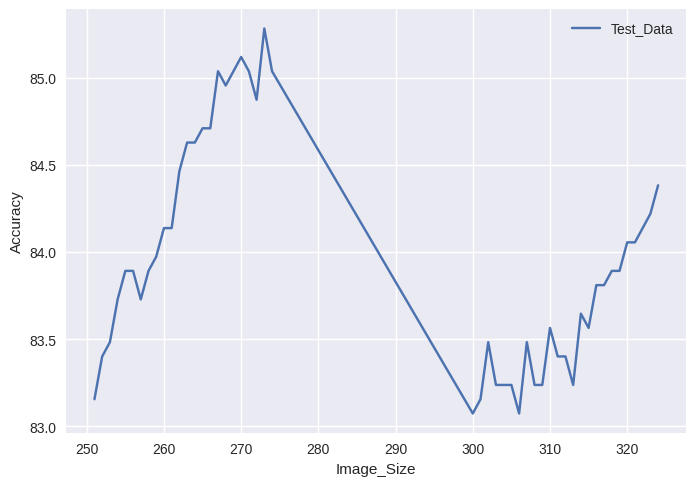

In [ ]:
draw_size_acc(dict_imgSize,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

In [ ]:
metrics_scores(test_evl_result,n_classes,cla_dict)

+--------+-----------+--------+-------+----------+
|  Type  | Precision | Recall |   F1  | Accuracy |
+--------+-----------+--------+-------+----------+
| akiec  |   0.7811  | 0.924  | 0.846 |          |
|  bcc   |   0.8153  | 0.727  | 0.769 |          |
|  bkl   |   0.8118  | 0.789  |  0.8  |          |
|   df   |   0.8333  | 0.857  | 0.845 |          |
|  mel   |   0.8371  | 0.851  | 0.844 |          |
|   nv   |   0.9448  | 0.875  | 0.909 |          |
|  vasc  |   0.9598  | 0.949  | 0.954 |          |
| Total: |           |        |       |  0.8528  |
+--------+-----------+--------+-------+----------+


In [ ]:
# #save
s0 = np.array(train_acc_list)
np.save(f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{img_title}_train_acc_{suf}.npy', s0)
s1 = np.array(train_loss_list)
np.save(f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{img_title}_train_loss_{suf}.npy', s1)
s2 = np.array(test_acc_list)
np.save(f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{img_title}_test_acc_{suf}.npy', s2)
s3 = np.array(val_acc_list)
np.save(f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{img_title}_val_acc_{suf}.npy', s2)
s4 = np.array(dict_batch)
np.save(f'/content/drive/MyDrive/Fix/{img_title}/{suf}/{img_title}_dict_batch_{suf}.npy', s2)

FileNotFoundError: ignored

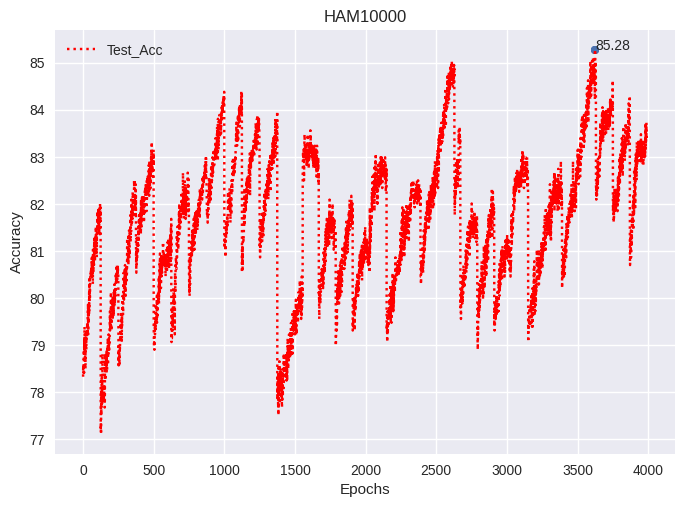

In [ ]:
show.test(write=True,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

FileNotFoundError: ignored

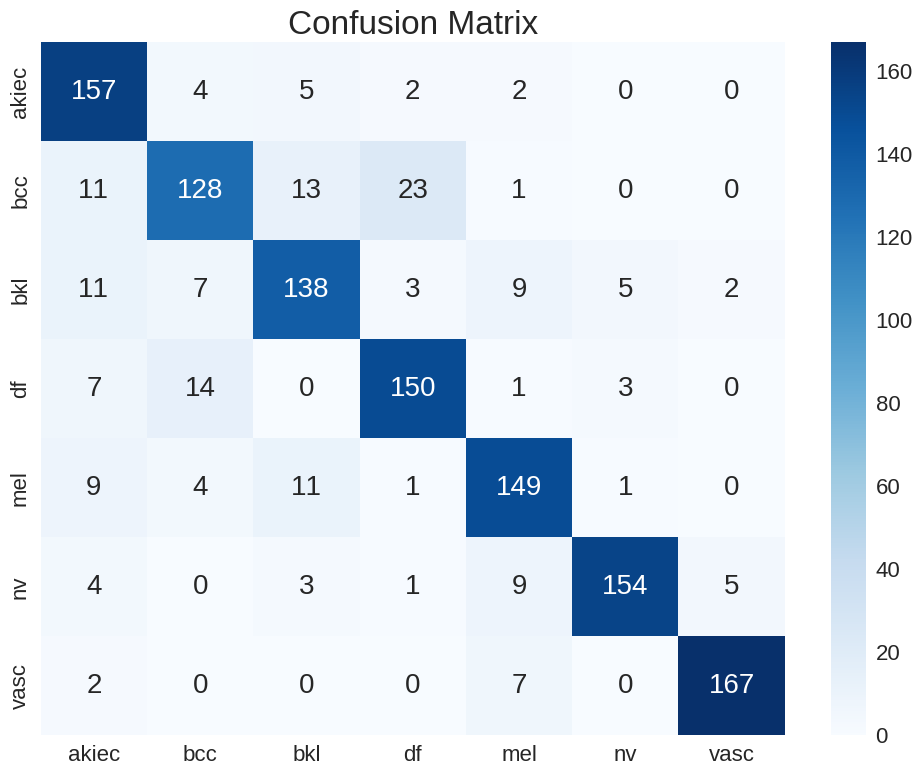

In [ ]:
confusion_matrix(test_evl_result,n_classes,cla_dict,test_dataset,img_title=img_title,suf=suf)

FileNotFoundError: ignored

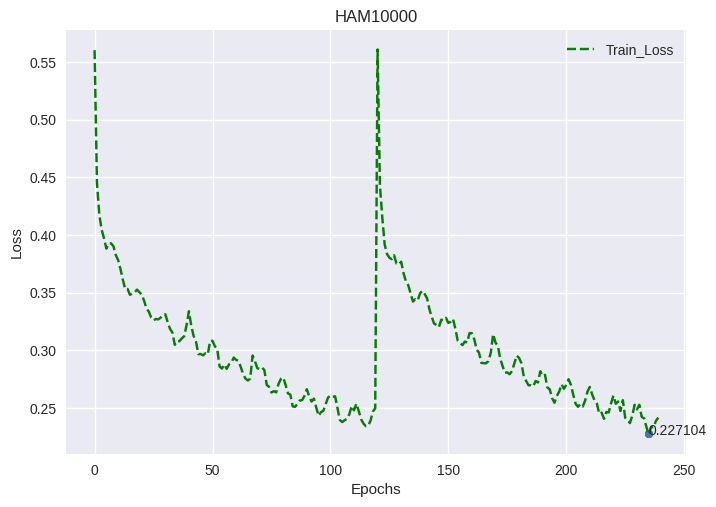

In [ ]:
plt.clf()#clear photo
show.train(write=True,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

FileNotFoundError: ignored

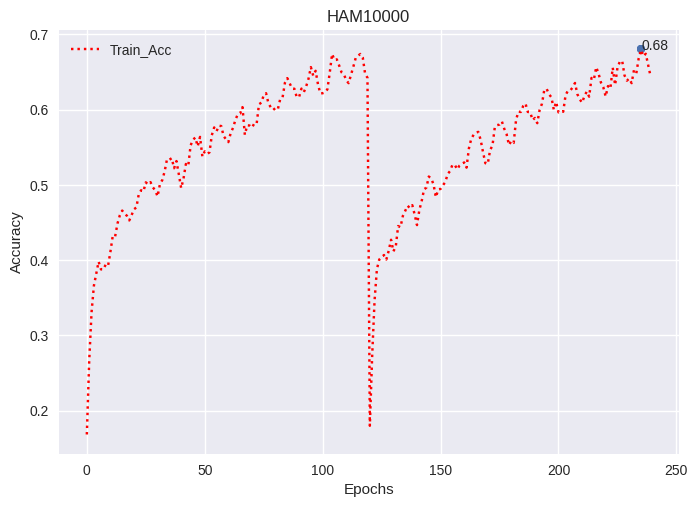

In [ ]:
show.train(opt='Acc',write=True,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

FileNotFoundError: ignored

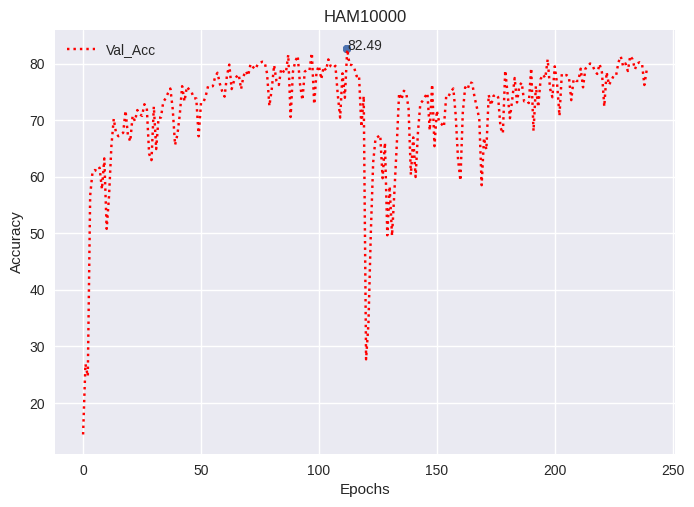

In [ ]:
show.val(write=True,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

In [ ]:
confusion_matrix(val_evl_result,n_classes,cla_dict,test_dataset,img_title=img_title,suf=suf)

In [ ]:
torch.cuda.memory.empty_cache()

In [ ]:
network.load_state_dict(torch.load(save_PATH))
dict_test = {}
dict_size = {}
test_doc = "test"#"test525png"#
for k in range(23,24):
    T_size = k
    for i in range(251,271):
        get_data(i)
        print(f"size:{i}")
        for j in range(9):
            test()
            if dict_size.get(i) is None or dict_size[i] < test_acc:
                dict_size[i] = test_acc

                if dict_test.get(k) is None or dict_test[k] < test_acc:
                    dict_test[k] = test_acc

            elif dict_test.get(k) is None or dict_test[k] < test_acc:
                    dict_test[k] = test_acc

Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:251
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.068%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.068%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.313%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.231%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.659%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.313%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.986%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.068%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.986%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:252
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.986%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:78.741%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.477%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:253
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.64%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.558%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:254
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.049%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.886%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.804%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:255
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:256
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:257
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.131%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:258
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:259
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.54%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:79.967%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.213%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.294%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:260
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.376%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:261
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.458%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:262
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.703%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:263
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.621%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:264
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.867%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.785%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:265
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:80.948%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:266
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.03%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.194%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:267
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.112%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.439%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:268
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.276%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.603%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:269
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.357%
Best_eval:[85.282%]
Using 7 classes.
using 3893 images for training, 971 images for validation, 1223 images for testing.
size:270
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.093%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.521%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.684%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.848%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:81.766%
Best_eval:[85.282%]
HAM10000 ==> test ...


  0%|          | 0/54 [00:00<?, ?it/s]

test_Acc:82.175%
Best_eval:[85.282%]


In [ ]:
show.conclusion(img_title=img_title)
print(sorted(dict_test.items(), key=lambda x: x[1], reverse=True)[0:9])
print(sorted(dict_size.items(), key=lambda x: x[1], reverse=True)[0:9])

=================Conclusion====================
Dataset:[HAM10000]
Best_Epoch [3625]
[Test] ACC:85.28%.
[(23, 82.17498064041138)]
[(270, 82.17498064041138), (268, 81.84791207313538), (269, 81.84791207313538), (267, 81.7661464214325), (266, 81.52084946632385), (265, 81.43908381462097), (262, 81.19378685951233), (264, 81.19378685951233), (260, 81.03025555610657)]


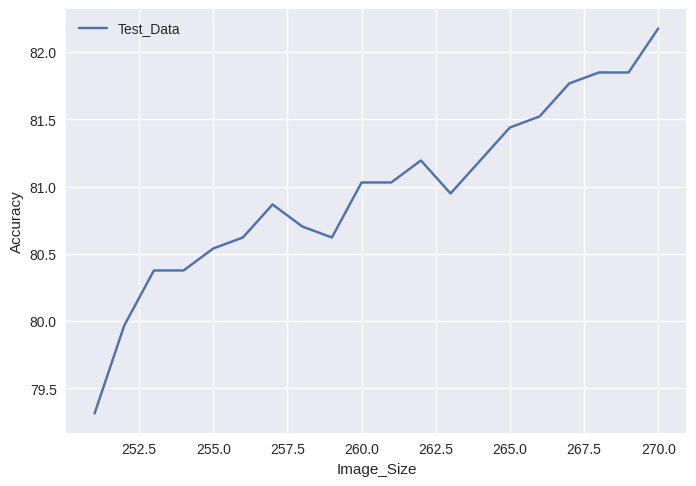

In [ ]:
draw_size_acc(dict_size,custom_path='/content/drive/MyDrive/Fix',img_title=img_title,suf=suf)

In [ ]:
metrics_scores(test_evl_result,n_classes,cla_dict)

+--------+-----------+--------+-------+----------+
|  Type  | Precision | Recall |   F1  | Accuracy |
+--------+-----------+--------+-------+----------+
| akiec  |   0.7811  | 0.924  | 0.846 |          |
|  bcc   |   0.8153  | 0.727  | 0.769 |          |
|  bkl   |   0.8118  | 0.789  |  0.8  |          |
|   df   |   0.8333  | 0.857  | 0.845 |          |
|  mel   |   0.8371  | 0.851  | 0.844 |          |
|   nv   |   0.9448  | 0.875  | 0.909 |          |
|  vasc  |   0.9598  | 0.949  | 0.954 |          |
| Total: |           |        |       |  0.8528  |
+--------+-----------+--------+-------+----------+


In [ ]:
# network.load_state_dict(torch.load(save_PATH))
# dict_test = {}
# dict_size = {}
# test_doc = "test525png384"#"test525png"#
# for k in range(22,33):
#     T_size = k
#     for i in range(300,308):
#         get_data(i)
#         print(f"size:{i}")
#         for j in range(7):
#             test()
#             if dict_size.get(i) is None or dict_size[i] < test_acc:
#                 dict_size[i] = test_acc

#                 if dict_test.get(k) is None or dict_test[k] < test_acc:
#                     dict_test[k] = test_acc

#             elif dict_test.get(k) is None or dict_test[k] < test_acc:
#                     dict_test[k] = test_acc

In [ ]:
# show.conclusion(img_title=img_title)
# print(sorted(dict_test.items(), key=lambda x: x[1], reverse=True)[0:9])
# print(sorted(dict_size.items(), key=lambda x: x[1], reverse=True)[0:9])